In [2]:
pip install wordcloud

  Obtaining dependency information for wordcloud from https://files.pythonhosted.org/packages/34/ac/72a4e42e76bf549dfd91791a6b10a9832f046c1d48b5e778be9ec012aa47/wordcloud-1.9.2-cp311-cp311-win_amd64.whl.metadata
  Using cached wordcloud-1.9.2-cp311-cp311-win_amd64.whl.metadata (3.4 kB)
Using cached wordcloud-1.9.2-cp311-cp311-win_amd64.whl (151 kB)
Note: you may need to restart the kernel to use updated packages.


In [3]:
from bs4 import BeautifulSoup
from bs4.dammit import EncodingDetector
import requests ## requests for data from websites 
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
import matplotlib.pyplot as plt 
from PIL import Image ## will help us render the image needed
from os import path, getcwd ## to access the image 
import numpy as np ## to render the image properly for our function 

from nltk.corpus import stopwords ## natural languge processing toolkit and clean up some of our text data
from nltk.tokenize import word_tokenize


**pulling data from the website**

In [4]:
def get_soup(html):
    """ get data for web page"""
    resp = requests.get(html)
    http_encoding = resp.encoding if 'charset' in resp.headers.get('content-type', '').lower() else None
    html_encoding = EncodingDetector.find_declared_encoding(resp.content, is_html=True)
    encoding = html_encoding or http_encoding
    soup = BeautifulSoup(resp.content, from_encoding=encoding)
    return soup

Let's check if that worked....

In [5]:
#webpage 
bp_transcripts = 'https://www.biggerpockets.com/podcast-transcripts'

#gets word soup from website 
soupout = get_soup(bp_transcripts)
soupout

<!DOCTYPE html>
<html class="no-js unknown-user-agent" lang="en">
<head>
<script defer="defer" src="//bpimg.biggerpockets.com/packs/js/runtime-bd900d8f21b5240a07b0.js"></script>
<script defer="defer" src="//bpimg.biggerpockets.com/packs/js/221-f816488bfbc80cf122ec.js"></script>
<script defer="defer" src="//bpimg.biggerpockets.com/packs/js/393-bef952d71110ca474d24.js"></script>
<script defer="defer" src="//bpimg.biggerpockets.com/packs/js/guest-4d1fcbc737de40d1cce0.js"></script>
<script defer="defer" src="//bpimg.biggerpockets.com/assets/application-694d434ee1dfccc707b6b7ca568081e5dd9de874b95e16222675c3a065307a79.js"></script>
<title>BiggerPockets Podcast Transcripts</title>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<meta charset="utf-8"/>
<meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/>
<meta content="Copyright (c)2004-2023 BiggerPockets, LLC." name="copyright"/>
<meta content="index, follow" name="robots"/>
<meta description="Read complete ep

Alright... we where able to get all the content from the link provided but...

we need to get/ store all the links of all the transcripts of each 'biggerpockets' podcast Let's writ a function to do so... 

In [5]:
def get_links(soup):
    """ Get links from a web page """
    http_link_list = [] 
    for link in soup.find_all('a', href=True):
        if link['href'][0] != '/': 
            http_link_list.append(link['href'].strip("'"))
    filtered_array = [item for item in http_link_list if not item.startswith("#")]
    return filtered_array 

In [6]:
#gets links from website     
h_links = get_links(soupout)
h_links

['https://www.biggerpockets.com/',
 'https://www.biggerpockets.com/bootcamps',
 'https://www.biggerpockets.com/blog/self-guided-bootcamps',
 'https://store.biggerpockets.com/',
 'https://www.biggerpockets.com/blog/real-estate-investing-bootcamps',
 'https://www.biggerpockets.com/blog/real-estate-investing-bootcamps',
 'https://biggerpockets.zoom.us/webinar/register/5117006165802/WN_TpdKr4DjQNOqhcH6qmBuiw',
 'https://biggerpockets.zoom.us/webinar/register/5117006165802/WN_TpdKr4DjQNOqhcH6qmBuiw',
 'https://get.biggerpockets.com/tenant-screening/',
 'https://www.biggerpockets.com/blog/pro-partners',
 'https://biggerpockets.foreclosure.com/',
 'https://www.biggerpockets.com/membership-types',
 'https://www.biggerpockets.com/membership-types',
 'https://get.biggerpockets.com/nreig/',
 'https://www.biggerpockets.com/events',
 'https://www.biggerpockets.com/agent/match',
 'https://www.biggerpockets.com/agent/match',
 'https://www.biggerpockets.com/business/finder/lenders',
 'https://www.bigg

In [7]:
#trims to only relevant links
html_links = h_links[5:163]
html_links

['https://www.biggerpockets.com/blog/real-estate-investing-bootcamps',
 'https://biggerpockets.zoom.us/webinar/register/5117006165802/WN_TpdKr4DjQNOqhcH6qmBuiw',
 'https://biggerpockets.zoom.us/webinar/register/5117006165802/WN_TpdKr4DjQNOqhcH6qmBuiw',
 'https://get.biggerpockets.com/tenant-screening/',
 'https://www.biggerpockets.com/blog/pro-partners',
 'https://biggerpockets.foreclosure.com/',
 'https://www.biggerpockets.com/membership-types',
 'https://www.biggerpockets.com/membership-types',
 'https://get.biggerpockets.com/nreig/',
 'https://www.biggerpockets.com/events',
 'https://www.biggerpockets.com/agent/match',
 'https://www.biggerpockets.com/agent/match',
 'https://www.biggerpockets.com/business/finder/lenders',
 'https://www.biggerpockets.com/business/finder/lenders',
 'https://www.biggerpockets.com/blog/cost-to-flip-a-house',
 'https://www.biggerpockets.com/blog/cost-to-flip-a-house',
 'https://www.biggerpockets.com/blog/new-evidence-suggets-that-banning-airbnbs-reduces-r

In [8]:
def get_ps(soup):
    """ get <p> tags from web page"""
    http_link_list = [] 
    for link in soup.find_all('p'):
        http_link_list.append(link.get_text())
    return http_link_list 

In [9]:
def get_text(text_array):
    """ get text from an array"""
    text = " ".join(text_array)
    return text

def get_episode_text(episode_list):
    """get text from all episodes in list"""
    text_return = []
    for i in episode_list:
        print(i)
        soup = get_soup(i)
        text_array = get_ps(soup)
        full_text = get_text(text_array)
        text_return.append(full_text)
    return text_return    

#return list of all episode text 
text_return_list = get_episode_text(html_links)


https://www.biggerpockets.com/blog/real-estate-investing-bootcamps
https://biggerpockets.zoom.us/webinar/register/5117006165802/WN_TpdKr4DjQNOqhcH6qmBuiw
https://biggerpockets.zoom.us/webinar/register/5117006165802/WN_TpdKr4DjQNOqhcH6qmBuiw
https://get.biggerpockets.com/tenant-screening/
https://www.biggerpockets.com/blog/pro-partners
https://biggerpockets.foreclosure.com/
https://www.biggerpockets.com/membership-types
https://www.biggerpockets.com/membership-types
https://get.biggerpockets.com/nreig/
https://www.biggerpockets.com/events
https://www.biggerpockets.com/agent/match
https://www.biggerpockets.com/agent/match
https://www.biggerpockets.com/business/finder/lenders
https://www.biggerpockets.com/business/finder/lenders
https://www.biggerpockets.com/blog/cost-to-flip-a-house
https://www.biggerpockets.com/blog/cost-to-flip-a-house
https://www.biggerpockets.com/blog/new-evidence-suggets-that-banning-airbnbs-reduces-rent-prices
https://www.biggerpockets.com/blog/new-evidence-suggets

https://www.biggerpockets.com/bpp117-david-allen-podcast-transcript-maximizing-productivity-to-get-things-done
https://www.biggerpockets.com/bpp116-nasar-elarabi-podcast-transcript-how-to-quit-your-job-through-wholesaling-flipping-action
https://www.biggerpockets.com/bpp115-jeff-greenberg-podcast-transcript-getting-started-with-apartment-complex-investing
https://www.biggerpockets.com/bpp114-scott-sutherland-podcast-transcript-how-to-invest-in-vacation-rentals
https://www.biggerpockets.com/bpp113-jay-papasan-podcast-transcript-becoming-a-millionaire-real-estate-investor
https://www.biggerpockets.com/bpp112-mark-updegraff-podcast-transcript-little-old-lady-house-investing
https://www.biggerpockets.com/bpp111-jefferson-lilly-podcast-transcript-unique-real-estate-niche
https://www.biggerpockets.com/bpp110-glenn-mccrorey-podcast-transcript-eliminating-the-hassle-factor-as-a-landlord
https://www.biggerpockets.com/bpp109-scott-smith-podcast-transcript-you-will-get-sued-how-to-survive
https:/

To join all the text from each podcast's transcript link we got from above 

In [10]:
def get_text(text_array):
    """ get text from an array"""
    text = " ".join(text_array)
    return text

all_text = get_text(text_return_list)
all_text

' Copyright ©2023 Zoom Video Communications, Inc. All rights reserved. \nPrivacy & Legal Policies\nDo Not Sell My Personal Information\nCookie Preferences\n Copyright ©2023 Zoom Video Communications, Inc. All rights reserved. \nPrivacy & Legal Policies\nDo Not Sell My Personal Information\nCookie Preferences\n FORUMS EDUCATION NETWORK TOOLS FIND DEALS BOOKSTORE BiggerPockets and TransUnion Full Credit Report powered by RentPrep have partnered to bring you one easy-to-use interface to easily screen tenants and manage reports FASTER than ever before. We believe in helping you throughout your investment process. BiggerPockets\'s tenant screening service, developed in collaboration with RentPrep, provides all the tenant screening tools you need—in one place. Submit all of your tenant screening reports in one easy place. © 2016 BiggerPockets Inc., All Rights Reserved EXPLORE MembershipCommunityEducationMarketplaceToolsFilePlaceREI ResourcesPerksGlossaryReviewsiOS AppAndroid App COMPANY Abou

Let's import nltk toolkit to remove stopwords and punctuation

In [11]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\pavan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [12]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\pavan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [13]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [14]:
def punctuation_stop(text):
    """remove punctuation and stop words"""
    filtered = []
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(text)
    for w in word_tokens:
        if w not in stop_words and w.isalpha():
            filtered.append(w.lower())
    return filtered

In [15]:
#removed punctuation and stop words 
filteredlst = punctuation_stop(all_text)
filteredlst

['copyright',
 'zoom',
 'video',
 'communications',
 'all',
 'rights',
 'reserved',
 'privacy',
 'legal',
 'policies',
 'do',
 'not',
 'sell',
 'my',
 'personal',
 'information',
 'cookie',
 'preferences',
 'copyright',
 'zoom',
 'video',
 'communications',
 'all',
 'rights',
 'reserved',
 'privacy',
 'legal',
 'policies',
 'do',
 'not',
 'sell',
 'my',
 'personal',
 'information',
 'cookie',
 'preferences',
 'forums',
 'education',
 'network',
 'tools',
 'find',
 'deals',
 'bookstore',
 'biggerpockets',
 'transunion',
 'full',
 'credit',
 'report',
 'powered',
 'rentprep',
 'partnered',
 'bring',
 'one',
 'interface',
 'easily',
 'screen',
 'tenants',
 'manage',
 'reports',
 'faster',
 'ever',
 'we',
 'believe',
 'helping',
 'throughout',
 'investment',
 'process',
 'biggerpockets',
 'tenant',
 'screening',
 'service',
 'developed',
 'collaboration',
 'rentprep',
 'provides',
 'tenant',
 'screening',
 'tools',
 'one',
 'place',
 'submit',
 'tenant',
 'screening',
 'reports',
 'one',
 

ok... now that we have all the words from the transcript in array, let's just remove words that don't particular mean anything more so to say... filler words that come up too many times 

In [16]:
#list of unwanted words 
unwanted = ['brandon','josh','one','guy','really','mean','little bit','thing','say','go','actually','even','probably','going','said','something','okay','maybe','got','well','way']

#remove unwanted words 
text = " ".join([ele for ele in filteredlst if ele not in unwanted])
text

'copyright zoom video communications all rights reserved privacy legal policies do not sell my personal information cookie preferences copyright zoom video communications all rights reserved privacy legal policies do not sell my personal information cookie preferences forums education network tools find deals bookstore biggerpockets transunion full credit report powered rentprep partnered bring interface easily screen tenants manage reports faster ever we believe helping throughout investment process biggerpockets tenant screening service developed collaboration rentprep provides tenant screening tools place submit tenant screening reports easy place biggerpockets all rights reserved explore membershipcommunityeducationmarketplacetoolsfileplacerei resourcesperksglossaryreviewsios appandroid app company about uspressadvertisingcareersstatscontact us important editorial guidelinesterms userulesprivacyfaq social facebooktwitteryoutubeinstagram every landlord wants find best maintain prope

In [17]:
#get the working directory 
d = getcwd()
d

'C:\\Users\\pavan\\Desktop\\Biggerpockets_logo_word_Cloud_From_Scraped_Data'

Which turns each pixel of the uploaded image into a hexadecial to read it has a mask

In [18]:
#numpy image file of mask image 
mask_logo = np.array(Image.open(path.join(d, "Bigger_Pockets_Logo4.png")))
mask_logo

array([[[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       ...,

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255

Genatrating Image..

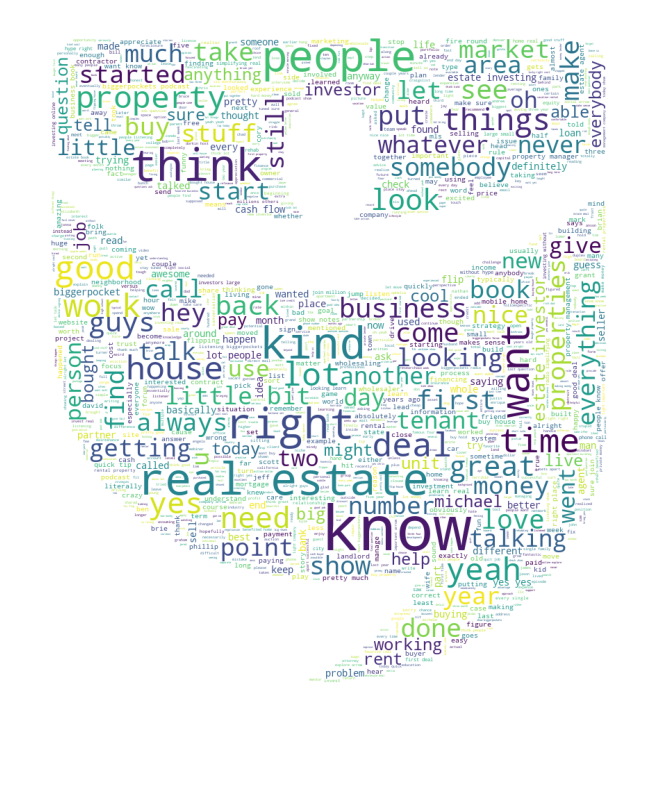

In [19]:
#create the word cloud object 
wc= WordCloud(background_color="white", max_words=2000, max_font_size=90, random_state=1, mask=mask_logo, stopwords=STOPWORDS)
wc.generate(text)

image_colors = ImageColorGenerator(mask_logo)

plt.figure(figsize=[10,10])
plt.imshow(wc)#.recolor(color_func=image_colors), interpolation="bilinear"
plt.axis('off')
plt.show()

we got what we wanted but, because of the colour some words are popping out more then the other, but the larger words should pop-out more for me...**As the podcast is mostly about investing in poperty and finacical management for everyone** so... let's make it into a same colour

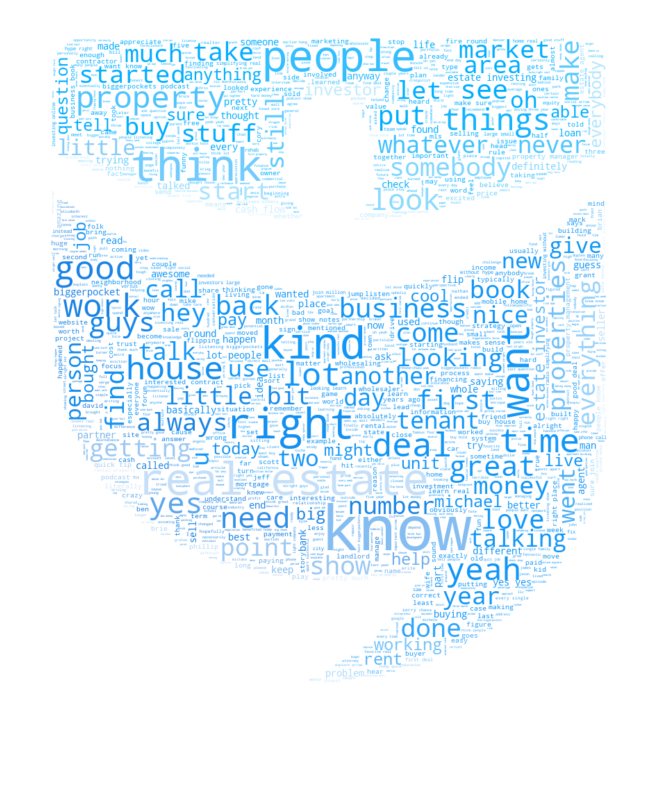

In [20]:
wc= WordCloud(background_color="white", max_words=2000, max_font_size=90, random_state=1, mask=mask_logo, stopwords=STOPWORDS)
wc.generate(text)

image_colors = ImageColorGenerator(mask_logo)

plt.figure(figsize=[10,10])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis('off')
plt.show()